In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from Data.Featurisation import Featurisation
import pvlib
from pvlib import location
import seaborn as sns
import scienceplots
plt.style.use(["science", "notebook"])

## Data intake

In [123]:
installation_int = 3
ceda = pd.read_pickle(f"Data/Sites/NWP_{installation_int}.pkl")
openmeteo = pd.read_pickle(f"Data/Sites/Reanalysis_{installation_int}.pkl")
pvgis = pd.read_pickle(f'Data/Sites/PVGIS_{installation_int}.pkl')
is_day = pd.read_pickle(f'Data/Sites/is_day_{installation_int}.pkl')
power = pd.read_pickle(f"Data/Sites/PV_{installation_int}.pkl")
meteo2CEDA = {'temperature_2m' :'temperature_1_5m', 
              "relative_humidity_2m":"relative_humidity_1_5m", 
              "pressure_msl": "pressure_MSL",
              "cloud_cover":"total_cloud_amount",
              "shortwave_radiation": "downward_surface_SW_flux",
              "diffuse_radiation":"diffuse_surface_SW_flux",
              "direct_normal_irradiance":"direct_surface_SW_flux",
              "wind_speed_10m": "wind_speed_10m",
              "wind_direction_10m": "wind_direction_10m"
              }
openmeteo = openmeteo.rename(columns=meteo2CEDA)
variates = list(ceda.columns)
rows = int(np.ceil(np.sqrt(len(variates))))

In [124]:
#Metadata
metadata = pd.read_pickle("Data/Sites/metadata.pkl")
metadata = metadata.loc[installation_int]
peakPower = metadata['Installed Power']
tilt = metadata['Tilt']
azimuth = metadata['Azimuth']
lat = metadata['Latitude']
lon = metadata['Longitude']
inv_limit = metadata['Inverter Power']
start = metadata['Start']
end = metadata['End']

## Historic plot

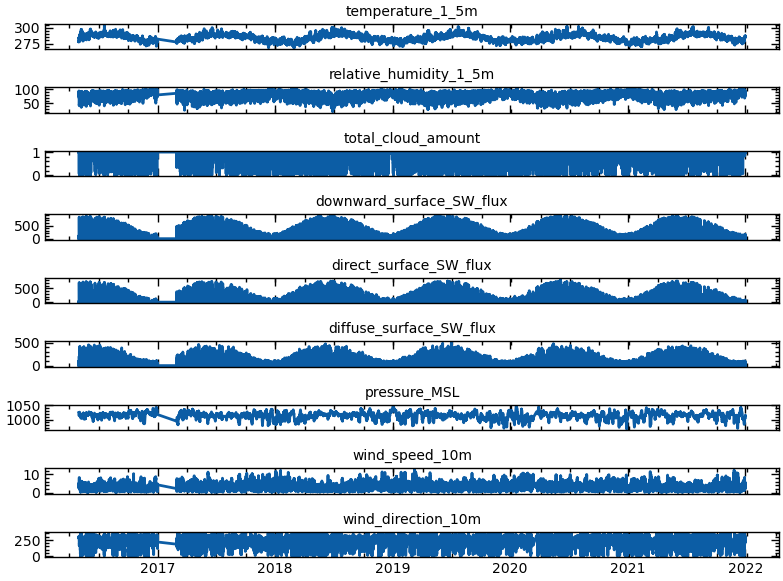

In [125]:
fig, axs = plt.subplots(len(variates), sharex=True)
plt.tight_layout()
for i, var in enumerate(variates):
    axs[i].plot(ceda[var])
    axs[i].set_title(var, fontsize = 10)
    axs[i].tick_params(labelsize=10)
plt.show()


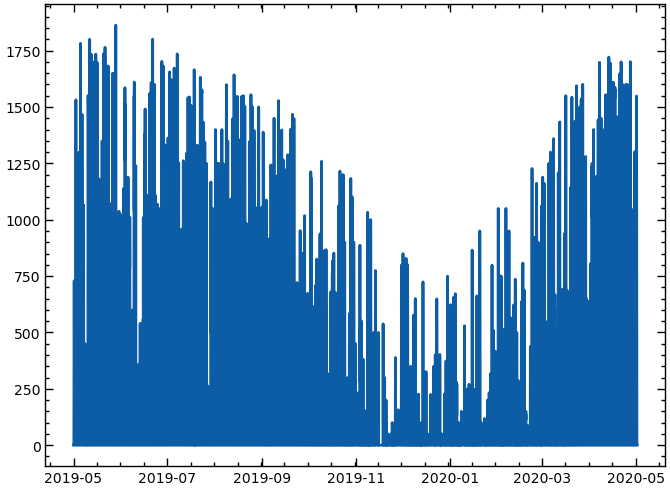

In [126]:
plt.figure()
plt.plot(power)
plt.tick_params(labelsize = 10)
plt.show()

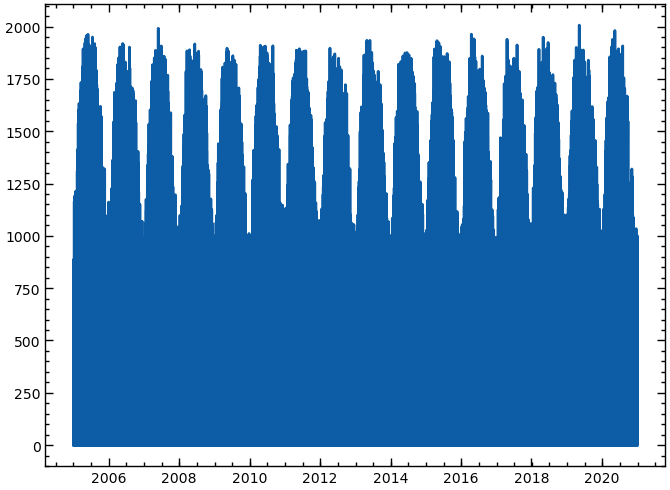

In [127]:
plt.figure()
plt.plot(pvgis)
plt.tick_params(labelsize = 10)
plt.show()

## NWP & era5 pairplots

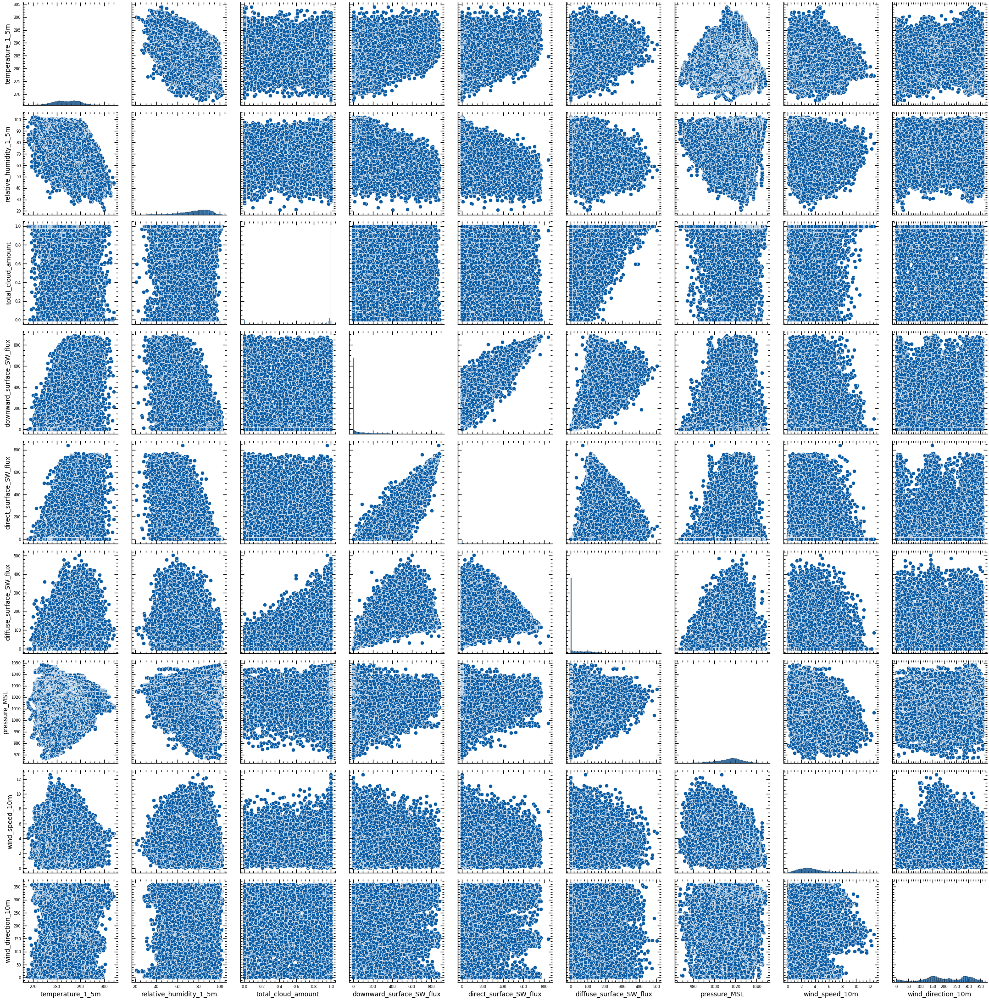

In [128]:
# Create a pairplot
g = sns.pairplot(ceda)

# Adjust the titles and labels
for ax in g.axes.flatten():
    # Title size
    ax.title.set_size(10)  # Set title size to 10
    # X-axis label size
    ax.xaxis.label.set_size(10)  # Set x-axis label size to 8
    # Y-axis label size
    ax.yaxis.label.set_size(10)  # Set y-axis label size to 8
    # Tick label size
    ax.tick_params(axis='both', labelsize=6)  # Set tick label size to 6

plt.show()

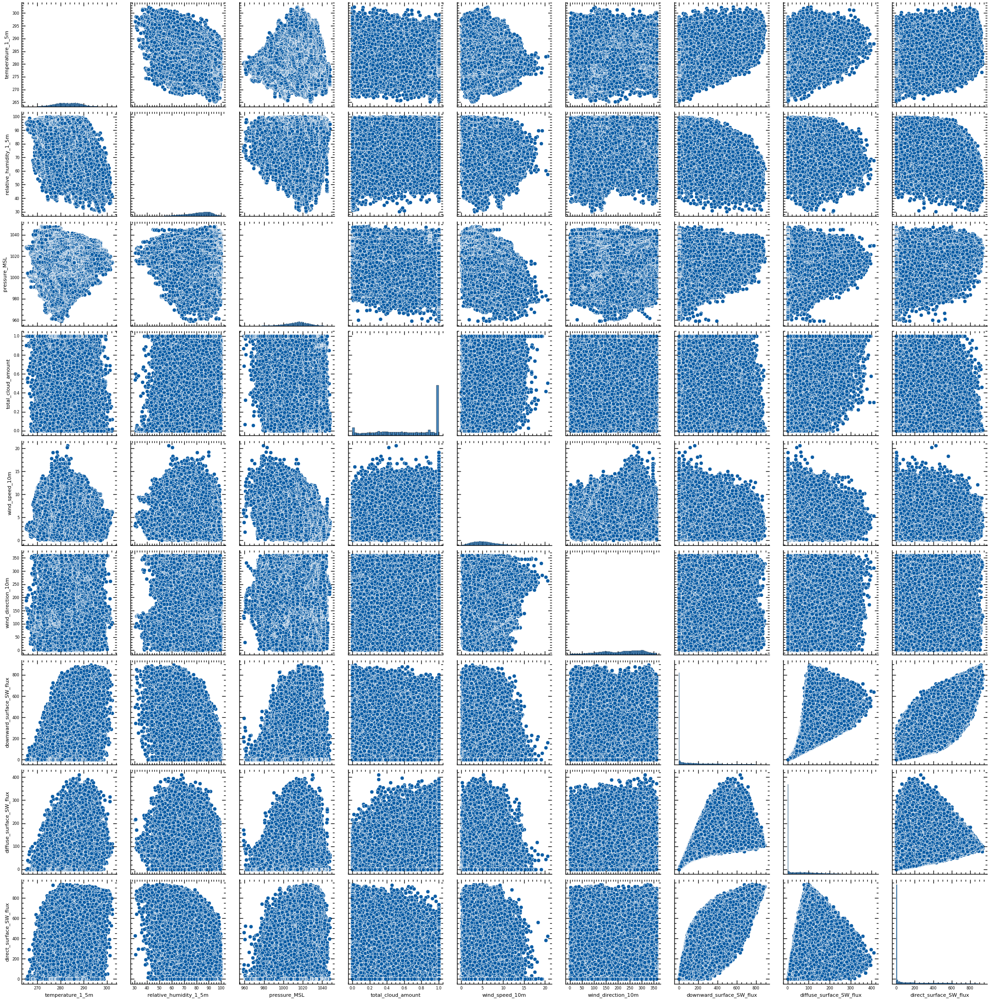

In [129]:
# Create a pairplot
g = sns.pairplot(openmeteo)

# Adjust the titles and labels
for ax in g.axes.flatten():
    # Title size
    ax.title.set_size(10)  # Set title size to 10
    # X-axis label size
    ax.xaxis.label.set_size(8)  # Set x-axis label size to 8
    # Y-axis label size
    ax.yaxis.label.set_size(8)  # Set y-axis label size to 8
    # Tick label size
    ax.tick_params(axis='both', labelsize=6)  # Set tick label size to 6

plt.show()

## Histograms

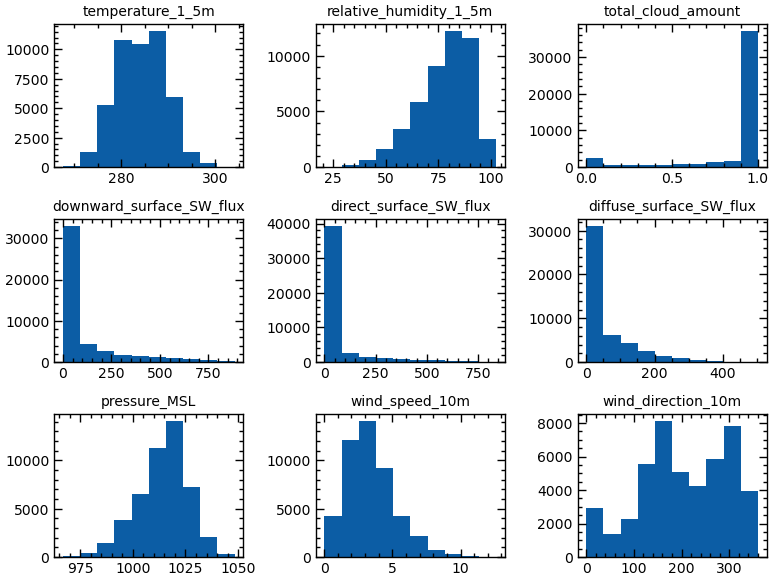

In [130]:
fig, axs = plt.subplots(rows, rows)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].hist(ceda[var])
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
plt.show()

## Correlation: CEDA & PV

Here add still correlation with transformed variables


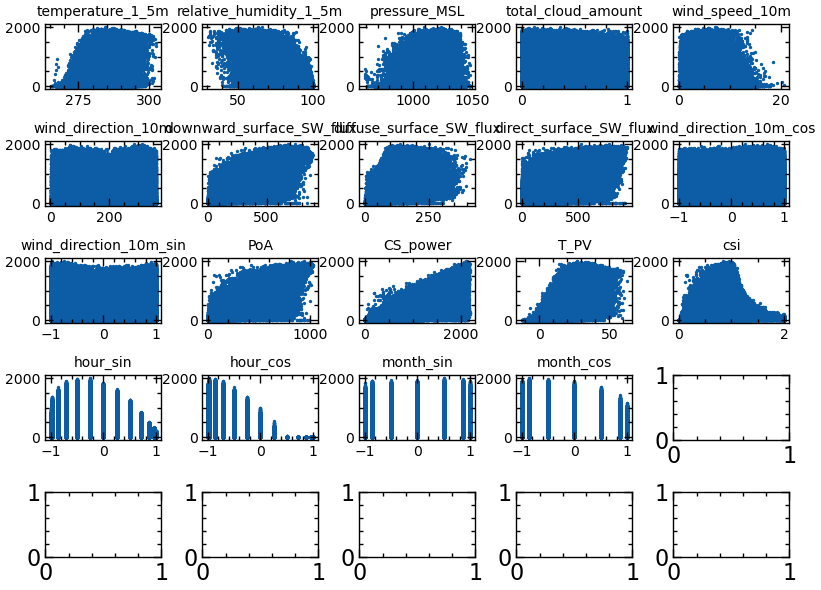

In [131]:
correl = pd.merge(pvgis, openmeteo, right_index=True, left_index=True)
data = Featurisation([correl])
data.data = data.cyclic_angle('wind_direction_10m')
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.clearsky_power(lat, lon, peakPower, tilt, azimuth)
data.data = data.cyclic_features()

correl = data.data[0]
variates = list(correl.columns)
variates.remove('P')
rows = int(np.ceil(np.sqrt(len(variates))))
fig, axs = plt.subplots(rows, rows)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].scatter(correl[var],correl ['P'],s=2)
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
plt.show()

/tmp/ipykernel_26754/2571007583.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


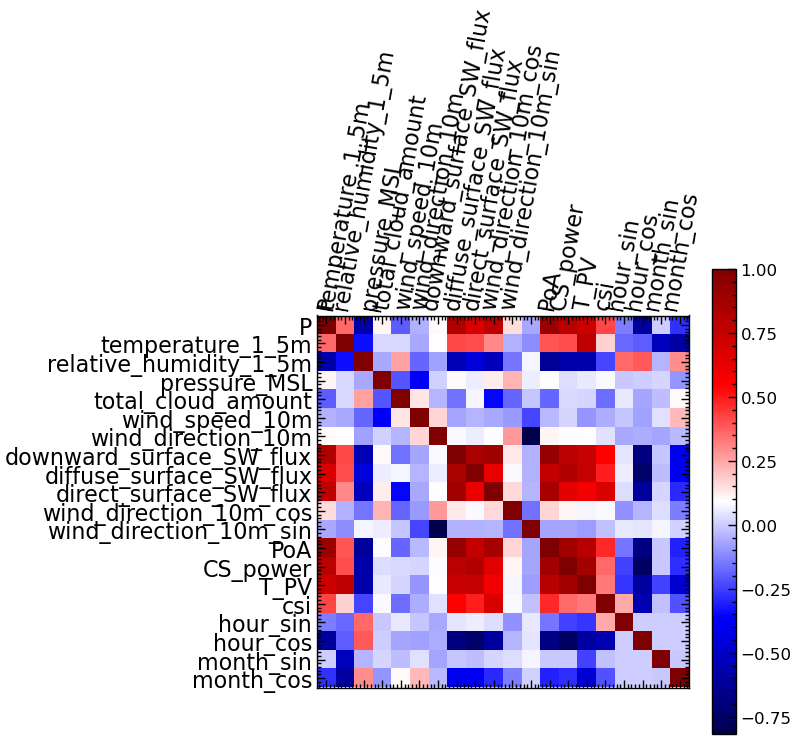

In [132]:
axs = plt.matshow(correl.corr(), cmap='seismic')
plt.xticks(ticks=range(len(variates)+1), labels=list(correl.columns), rotation= 80)
plt.yticks(ticks=range(len(variates)+1), labels = list(correl.columns), rotation= 0)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.tight_layout()
plt.show()

In [133]:
power

,P
datetime,
2019-05-01 00:00:00+00:00,0.0
2019-05-01 01:00:00+00:00,0.0
2019-05-01 02:00:00+00:00,0.0
2019-05-01 03:00:00+00:00,0.0
2019-05-01 04:00:00+00:00,0.0
...,...
2020-05-01 19:00:00+00:00,0.0
2020-05-01 20:00:00+00:00,0.0
2020-05-01 21:00:00+00:00,0.0


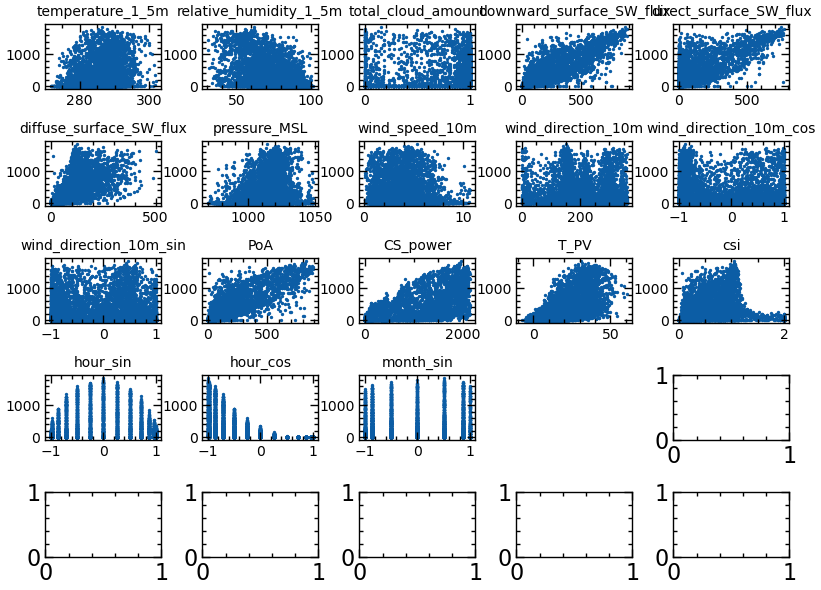

In [134]:
correl = pd.merge(power, ceda, right_index=True, left_index=True)
data = Featurisation([correl])
data.data = data.cyclic_angle('wind_direction_10m')
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.clearsky_power(lat, lon, peakPower, tilt, azimuth)
data.data = data.cyclic_features()


correl = data.data[0]
variates = list(correl.columns)
try:
    variates.remove('P')
except:
    pass
rows = int(np.ceil(np.sqrt(len(variates))))
fig, axs = plt.subplots(rows, rows)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].scatter(correl[var],correl ['P'],s=2)
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
fig.delaxes(axs[3,3])
plt.show()

/tmp/ipykernel_26754/2571007583.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


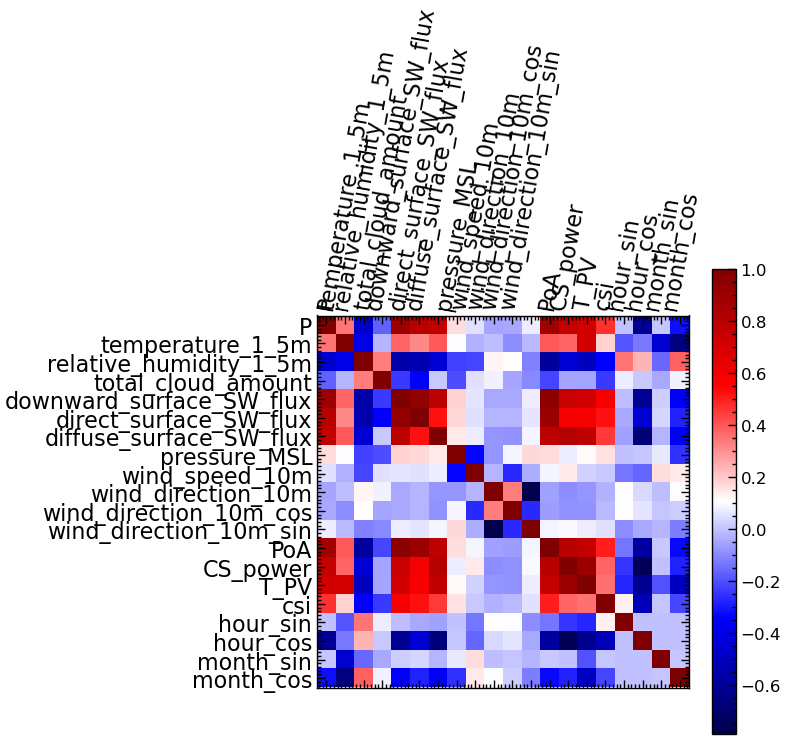

In [135]:
axs = plt.matshow(correl.corr(), cmap='seismic')
plt.xticks(ticks=range(len(variates)+1), labels=list(correl.columns), rotation= 80)
plt.yticks(ticks=range(len(variates)+1), labels = list(correl.columns), rotation= 0)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.tight_layout()
plt.show()

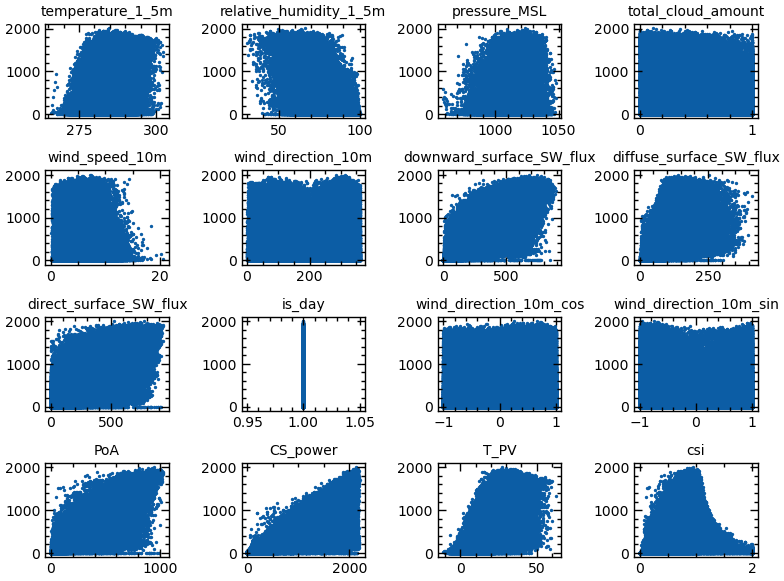

In [136]:
# Now with is_day
is_day = is_day.astype(bool)
correl = pd.merge(pvgis, openmeteo,  right_index=True, left_index=True)
correl = pd.merge(correl, is_day,  right_index=True, left_index=True)
correl = correl.loc[correl["is_day"]]

data = Featurisation([correl])
data.data = data.cyclic_angle('wind_direction_10m')
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.PoA(lat, lon, tilt, azimuth, )
data.data = data.clearsky_power(lat, lon, peakPower, tilt, azimuth)

correl = data.data[0]
variates = list(correl.columns)
variates.remove('P')
rows = int(np.ceil(np.sqrt(len(variates))))
fig, axs = plt.subplots(rows, rows)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].scatter(correl[var],correl ['P'],s=2)
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
plt.show()


/tmp/ipykernel_26754/2571007583.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


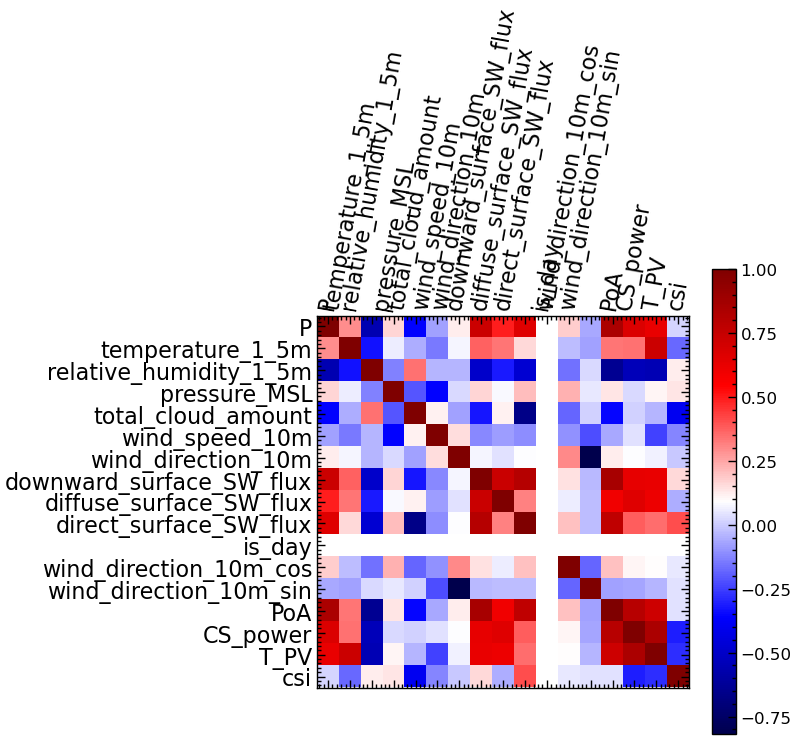

In [137]:
axs = plt.matshow(correl.corr(), cmap='seismic')
plt.xticks(ticks=range(len(variates)+1), labels=list(correl.columns), rotation= 80)
plt.yticks(ticks=range(len(variates)+1), labels = list(correl.columns), rotation= 0)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.tight_layout()
plt.show()

## PV VS PVGIS

(0.0, 2000.0)

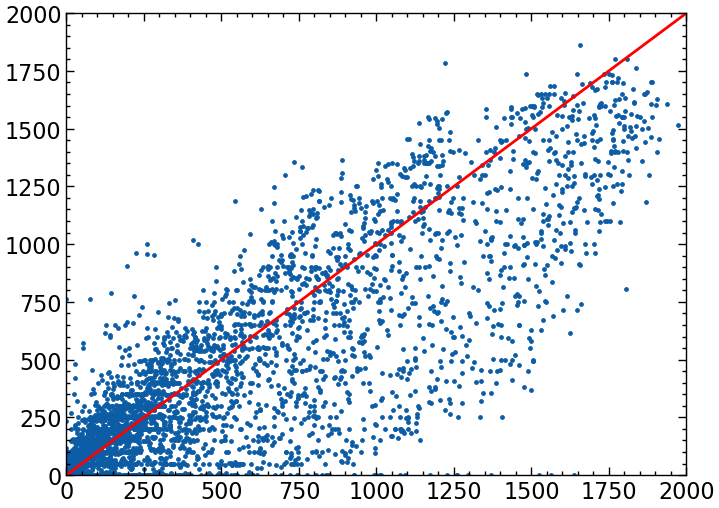

In [138]:
powers= pd.merge(pvgis, power, left_index=True, right_index=True)
plt.scatter(powers['P_x'], powers['P_y'], s=6)
plt.axline((0,0), (1,1), color='red')
plt.xlim([0,2000])
plt.ylim([0,2000])

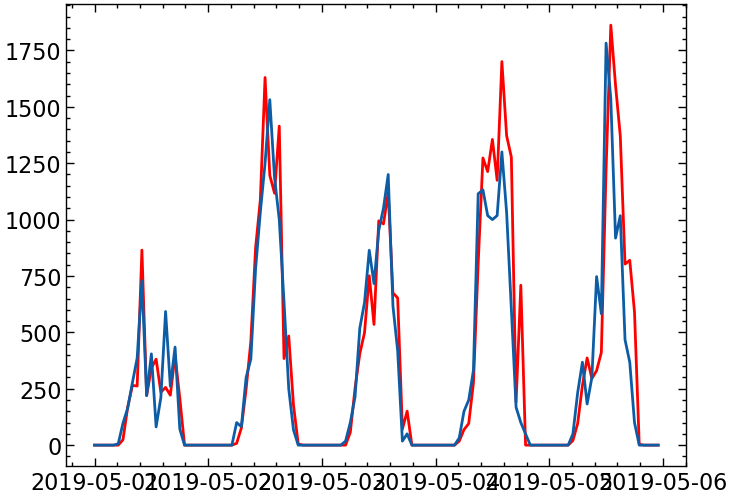

In [139]:
plt.plot(powers['P_x']['2019-05-01':'2019-05-05'], color='red')
plt.plot(powers['P_y']['2019-05-01':'2019-05-05'])

In [140]:
powers.corr()

,P_x,P_y
P_x,1.000000,0.892586
P_y,0.892586,1.000000


## CEDA VS OPENMETEO

In [141]:
openmeteo = openmeteo.reindex(ceda.index)
variates = list(ceda.columns)
rows = int(np.ceil(np.sqrt(len(variates))))

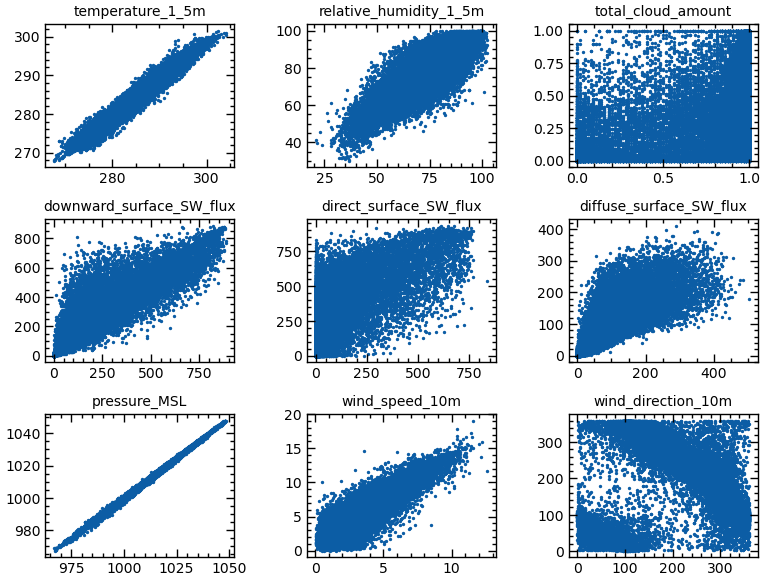

In [142]:
fig, axs = plt.subplots(rows, rows)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].scatter(ceda[var], openmeteo[var],s=2)
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
plt.show()

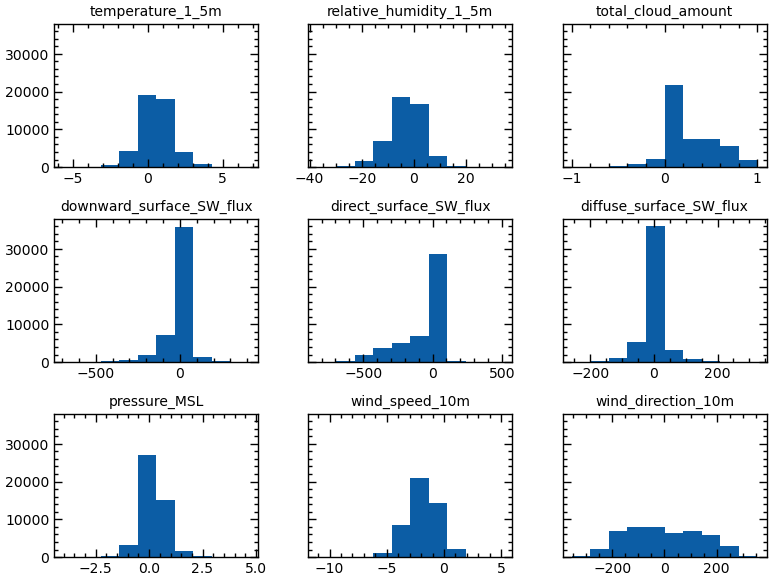

In [143]:
fig, axs = plt.subplots(rows, rows, sharey=True)
plt.tight_layout()
for i, var in enumerate(variates):
    x = i // rows
    y = i % rows
    axs[x,y].hist(ceda[var]-openmeteo[var])
    axs[x,y].set_title(var, fontsize = 10)
    axs[x,y].tick_params(labelsize=10)
plt.show()

In [144]:
powers.tail(50)

,P_x,P_y
2020-04-29 22:00:00+00:00,0.00,0.00
2020-04-29 23:00:00+00:00,0.00,0.00
2020-04-30 00:00:00+00:00,0.00,0.00
2020-04-30 01:00:00+00:00,0.00,0.00
2020-04-30 02:00:00+00:00,0.00,0.00
2020-04-30 03:00:00+00:00,0.00,0.00
2020-04-30 04:00:00+00:00,0.00,0.00
2020-04-30 05:00:00+00:00,0.00,50.00
2020-04-30 06:00:00+00:00,75.71,151.42
2020-04-30 07:00:00+00:00,244.51,350.00


In [145]:
for k in range(-10,10):
    x = powers['P_x'].shift(k)
    print(f"k={k}",powers['P_y'].corr(x))
    print((power['P']-x).max())

k=-10 -0.2467507974262899
1862.92
k=-9 -0.1926416442545428
1862.92
k=-8 -0.10909727843239801
1862.92
k=-7 0.010231379817443874
1778.91
k=-6 0.16274366305798801
1649.25
k=-5 0.3432299348904379
1555.8300000000002
k=-4 0.5293199485988012
1496.18
k=-3 0.7019605509895733
1370.72
k=-2 0.8412808116224246
1373.97
k=-1 0.9170121681949778
1097.7299999999998
k=0 0.8925858569416798
763.85
k=1 0.7419003641333436
1371.3000000000002
k=2 0.5597752843984714
1509.67
k=3 0.36969369506786653
1489.18
k=4 0.1922353944374731
1563.51
k=5 0.0362881208905923
1702.26
k=6 -0.0879541760073445
1696.77
k=7 -0.17673717107171485
1803.74
k=8 -0.23374357998195885
1862.92
k=9 -0.2680652168589175
1862.92


k=-10 -0.33560410073917407
k=-9 -0.30913015254146237
k=-8 -0.2618242471795737
k=-7 -0.18964851152493015
k=-6 -0.08875968826560697
k=-5 0.04249741018447331
k=-4 0.1999121756015572
k=-3 0.37531146334623294
k=-2 0.5541591869556622
k=-1 0.7134781236973902
k=0 0.8277695578960327
k=1 0.8761928775577038
k=2 0.8493200067001647
k=3 0.7575774218849544
k=4 0.6170071139503487
k=5 0.4482570580557953
k=6 0.2719476146089818
k=7 0.10583840244050977
k=8 -0.03922140832669904
k=9 -0.15689265015757042


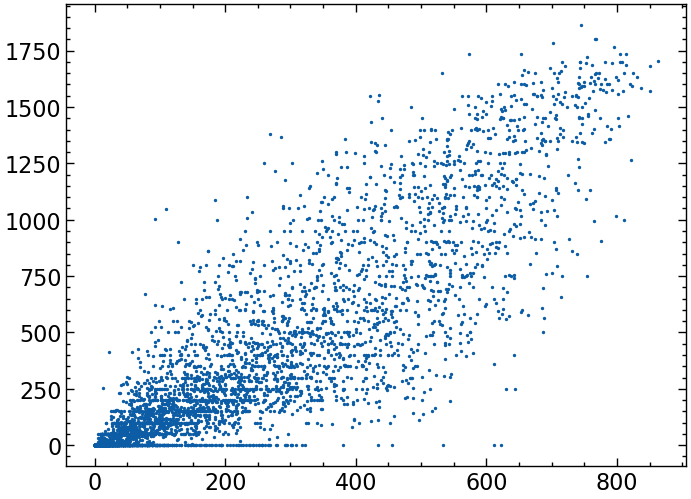

In [146]:
debug = pd.merge(openmeteo, power, left_index=True, right_index=True)
plt.scatter(debug['downward_surface_SW_flux'], debug['P'], s=2)
for k in range(-10,10):
    print(f"k={k}",pvgis.corr(openmeteo['downward_surface_SW_flux'].shift(k)))

## Irradiance forecast errors grouped by solar zenith angle

In [147]:
irradiances_forecast = ceda[['downward_surface_SW_flux', 'direct_surface_SW_flux', "diffuse_surface_SW_flux"]]
irradiances_truth = openmeteo[['downward_surface_SW_flux', 'direct_surface_SW_flux', "diffuse_surface_SW_flux"]]
latitude,longitude = 52.0499, 5.07391
site = location.Location(latitude, longitude, tz='UTC')
times = irradiances_forecast.index
solar_pos = site.get_solarposition(times)
print(solar_pos)
zenith = np.deg2rad(solar_pos['apparent_zenith'])
cos_zenith = np.cos(zenith)
error = pd.DataFrame(irradiances_forecast - irradiances_truth)
error['cos_zenith'] = cos_zenith
bins = np.arange(0, 1.1, 0.1)

# Group by custom bins for solar zenith angle
error['cos_zenith_interval'] = pd.cut(error['cos_zenith'], bins=bins)

mean_list = []
rmse_list = []
grouped = error.groupby('cos_zenith_interval')
for error_column in error.columns:
    if error_column != 'cos_zenith' and error_column != 'cos_zenith_interval':
    
        mean = grouped[error_column].mean()
    
        rmse = np.sqrt(grouped[error_column].apply(lambda x: np.mean(x**2)))
    
        # Rename the series with the error column name
        mean.name = error_column + '_' + 'mean'
        rmse.name = error_column + '_' + 'rmse'

        # Append to the results list
        mean_list.append(mean)
        rmse_list .append(rmse)

# Concatenate the results into a DataFrame
mean_df = pd.concat(mean_list, axis=1).reset_index()
rmse_df = pd.concat(rmse_list, axis=1).reset_index()




                           apparent_zenith      zenith  apparent_elevation  \
2016-05-01 00:00:00+00:00       112.622981  112.622981          -22.622981   
2016-05-01 01:00:00+00:00       110.414493  110.414493          -20.414493   
2016-05-01 02:00:00+00:00       105.970273  105.970273          -15.970273   
2016-05-01 03:00:00+00:00        99.710353   99.710353           -9.710353   
2016-05-01 04:00:00+00:00        92.100031   92.100031           -2.100031   
...                                    ...         ...                 ...   
2021-12-31 19:00:00+00:00       119.696697  119.696697          -29.696697   
2021-12-31 20:00:00+00:00       128.845888  128.845888          -38.845888   
2021-12-31 21:00:00+00:00       137.506183  137.506183          -47.506183   
2021-12-31 22:00:00+00:00       144.912271  144.912271          -54.912271   
2021-12-31 23:00:00+00:00       149.823465  149.823465          -59.823465   

                           elevation     azimuth  equation_of_t

/tmp/ipykernel_26754/3096072424.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = error.groupby('cos_zenith_interval')


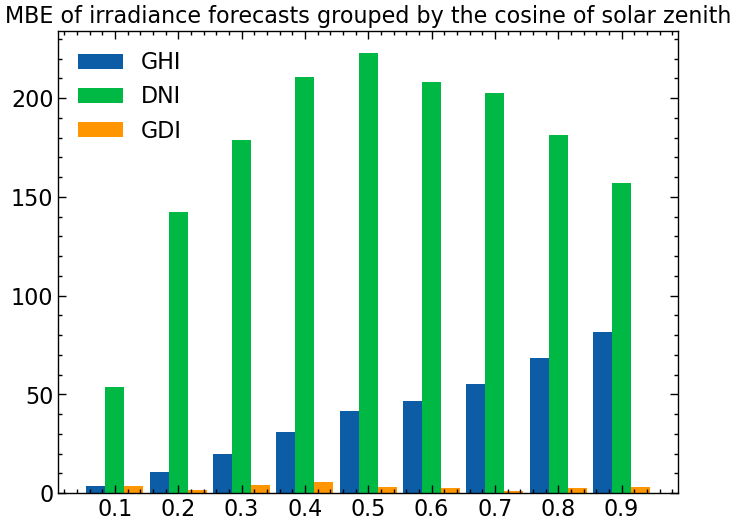

In [148]:
plt.figure()
x_axis = np.arange(len(mean_df.index))
plt.bar(x_axis-0.3, abs(mean_df["downward_surface_SW_flux_mean"]), 0.3, label = "GHI")
plt.bar(x_axis, abs(mean_df["direct_surface_SW_flux_mean"]), 0.3, label = "DNI")
plt.bar(x_axis+0.3, abs(mean_df["diffuse_surface_SW_flux_mean"]), 0.3, label = "GDI")
plt.title('MBE of irradiance forecasts grouped by the cosine of solar zenith')
plt.xticks(ticks = range(len(mean_df.index)-1), labels = [x/10 for x in range(1, 10)])

plt.legend()
plt.show()

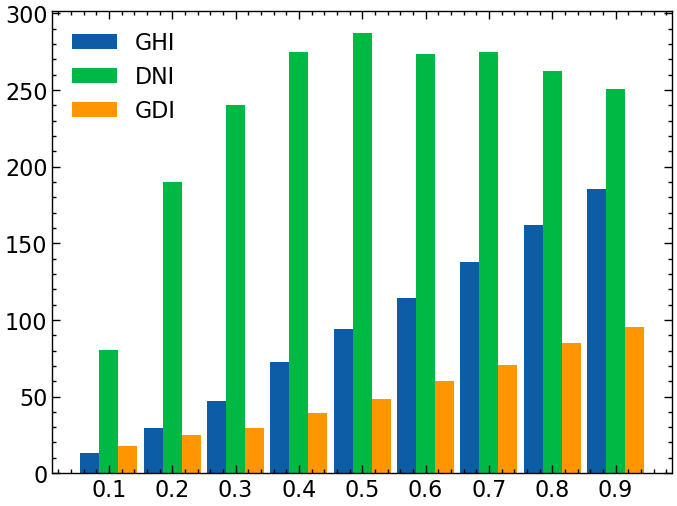

In [149]:
plt.figure()
x_axis = np.arange(len(rmse_df.index))
plt.bar(x_axis-0.3, abs(rmse_df["downward_surface_SW_flux_rmse"]), 0.3, label = "GHI")
plt.bar(x_axis, abs(rmse_df["direct_surface_SW_flux_rmse"]), 0.3, label = "DNI")
plt.bar(x_axis+0.3, abs(rmse_df["diffuse_surface_SW_flux_rmse"]), 0.3, label = "GDI")
plt.xticks(ticks = range(len(mean_df.index)-1), labels = [x/10 for x in range(1, 10)])


plt.legend()
plt.show()

In [150]:
daytime = daytime[daytime['is_day']]
plt.scatter(daytime['downward_surface_SW_flux'], daytime['P'], s=2)

NameError: name 'daytime' is not defined